In [1]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import cmocean
import xmitgcm
%matplotlib inline
import os
import sys
import mds

In [2]:
import matplotlib as mpl        #Used for controlling color
import matplotlib.colors  

In [3]:
from IPython import display
import time

In [4]:
import seaborn as sb

In [5]:
from datetime import date

In [6]:
plt.rcParams.update({'font.size': 16
    , 'legend.markerscale': 1., 'axes.titlesize': 16, 'axes.labelsize' : 16,
      'legend.fontsize' : 14,'legend.handlelength': 3})

plt.rc('xtick', labelsize=14) 
plt.rc('ytick', labelsize=14)

color2 = '#6495ed'
color1 = '#ff6347'
color5 = '#8470ff'
color3 = '#3cb371'
color4 = '#ffd700'
color6 = '#ba55d3'


In [7]:
plt.rcParams.update({'figure.figsize' : (14,6)})


In [16]:
dir_input = '/central/groups/oceanphysics/anirban/NA/inputfiles/NA_2160/NA_2160/input_ll1815/'
dirhydrog = '/central/groups/oceanphysics/anirban/hydrog_BC_IC_from_llc270/'

In [8]:
dir_tides = '/central/groups/oceanphysics/anirban/tides_NAtpxo8_20080101/'

In [9]:
f_amps = open(dir_tides+'am_z_mon_001.bin', 'rb')
am_z = np.fromfile(f_amps, '>f4')
am_z.shape = (532,1815,13)
f_ph = open(dir_tides+'ph_z_mon_001.bin', 'rb')
ph_z = np.fromfile(f_ph, '>f4')
ph_z.shape = (532,1815,13)
ph_z_masked = np.ma.masked_where(ph_z==0, ph_z)
am_z_masked = np.ma.masked_where(ph_z==0, am_z)

watermask = ph_z_masked.mask
landmask = np.ma.masked_where(watermask!=True, watermask)  

In [20]:
f_bathy = open(dir_input+'bathy.bin', 'rb')
bathy = np.fromfile(f_bathy, '>f4')

bathy.shape=(532,1815)


In [59]:
f_salt = open(dirhydrog+'S0_1815x532x100.bin', 'rb')
salt = np.fromfile(f_salt, '>f4')

salt.shape=(100,532,1815)

f_u= open(dirhydrog+'U0_1815x532x100.bin', 'rb')
u = np.fromfile(f_u, '>f4')

u.shape=(100,532,1815)



In [34]:
salt.shape, bathy.shape, am_z.shape

((100, 532, 1815), (532, 1815), (532, 1815, 13))

In [55]:
dir_tideBC = '/central/groups/oceanphysics/anirban/tideBC_tpxo8_wEBC_1813/'

f_amE = open(dir_tideBC+'OBEuam_532x13.bin', 'rb')
am_u = np.fromfile(f_amE, '>f4')
am_u.shape = (13,532)


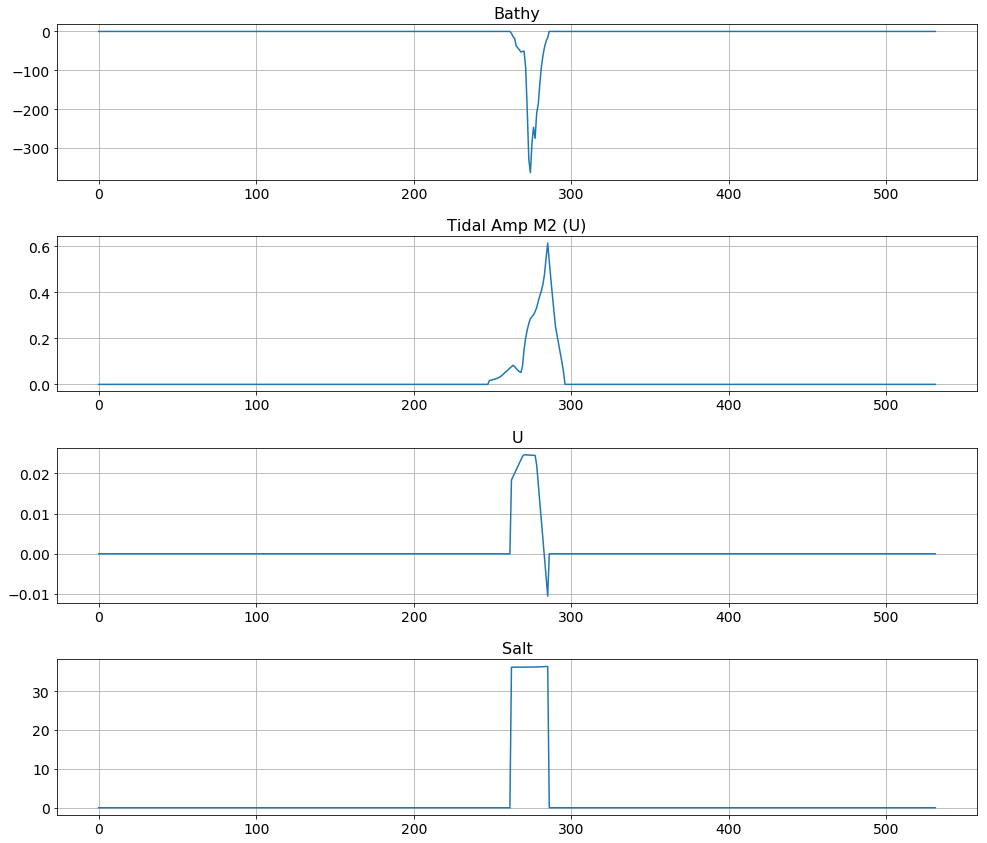

In [67]:
jindex = -3
plt.figure(figsize=(14,12))
plt.subplot(411)
plt.plot(bathy[:,jindex])
plt.title('Bathy')
plt.grid()
plt.subplot(412)
plt.plot(am_u[0,:])
plt.title('Tidal Amp M2 (U)')
plt.grid()

plt.subplot(413)
plt.plot(u[0,:,jindex])
plt.title('U')
plt.grid()

plt.subplot(414)
plt.plot(salt[0,:,jindex])
plt.title('Salt')
plt.tight_layout()
plt.grid()


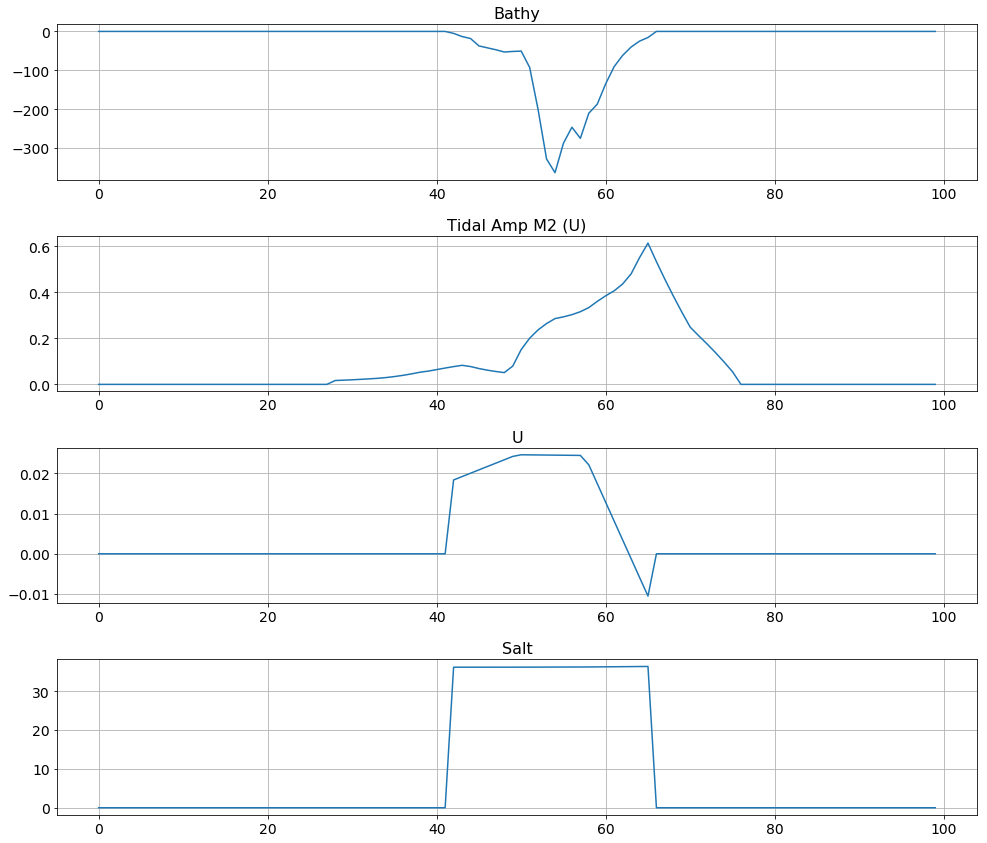

In [68]:
jindex = -3
plt.figure(figsize=(14,12))
plt.subplot(411)
plt.plot(bathy[220:320,jindex])
plt.title('Bathy')
plt.grid()

plt.subplot(412)
plt.plot(am_u[0,220:320])
plt.title('Tidal Amp M2 (U)')
plt.grid()

plt.subplot(413)
plt.plot(u[0,220:320,jindex])
plt.title('U')
plt.grid()

plt.subplot(414)
plt.plot(salt[0,220:320,jindex])
plt.title('Salt')
plt.tight_layout()
plt.grid()


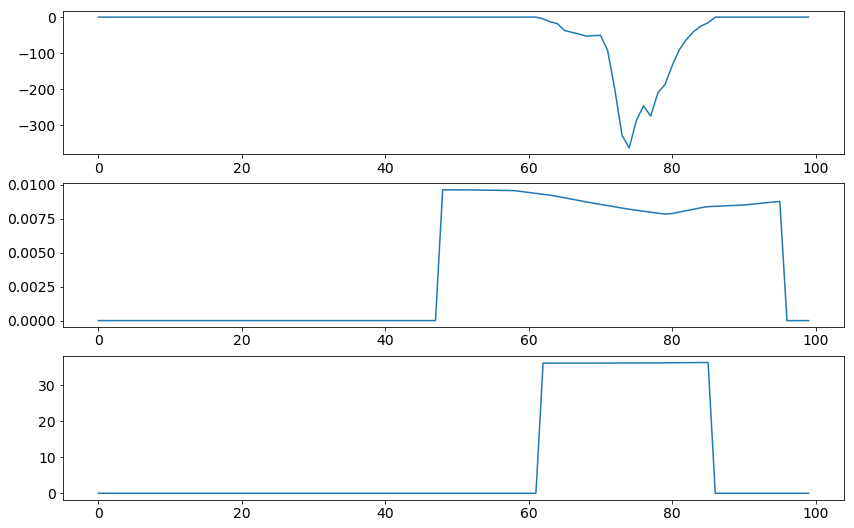

In [54]:
jindex = -3
plt.figure(figsize=(14,9))
plt.subplot(311)
plt.plot(bathy[200:300,jindex])
plt.subplot(312)
plt.plot(am_z[200:300,jindex,0])
plt.subplot(313)
plt.plot(salt[0,200:300,jindex])

In [15]:
ph_z_masked[:,-3,0]

masked_array(data=[--, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --, --, --, --, --, --, --, --, --, --, --, --, --,
                   --, --

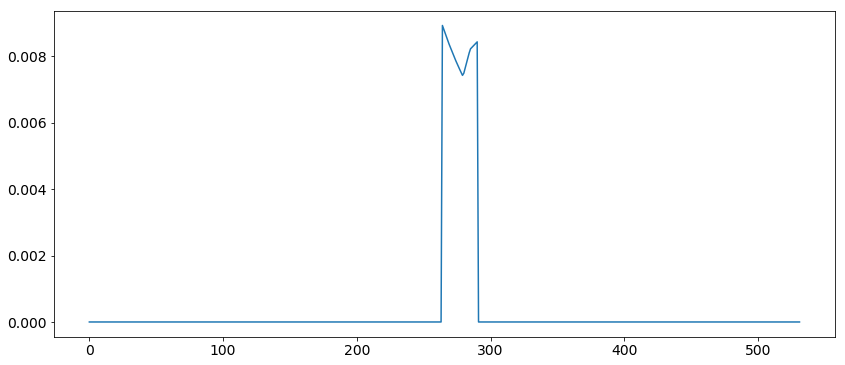

In [12]:
plt.plot(am_z[:,1814,0])

In [10]:
cmocean.cm.cmapnames

['thermal',
 'haline',
 'solar',
 'ice',
 'gray',
 'oxy',
 'deep',
 'dense',
 'algae',
 'matter',
 'turbid',
 'speed',
 'amp',
 'tempo',
 'rain',
 'phase',
 'topo',
 'balance',
 'delta',
 'curl',
 'diff',
 'tarn']

In [25]:
dirrun = '/central/groups/oceanphysics/anirban/NA/experiments/run_ll1815_04'

In [27]:
ds = xmitgcm.open_mdsdataset(dirrun, iters=None)

In [28]:
ds

<xarray.Dataset>
Dimensions:  (XC: 1815, XG: 1815, YC: 532, YG: 532, Z: 100, Zl: 100, Zp1: 101, Zu: 100)
Coordinates:
  * XC       (XC) >f4 -81.5625 -81.520836 -81.47917 -81.4375 ... 0.0 0.0 0.0 0.0
  * YC       (YC) >f4 26.87238 26.906544 26.9407 26.974846 ... 0.0 0.0 0.0 0.0
  * XG       (XG) >f4 -81.583336 -81.54167 -81.5 -81.458336 ... 0.0 0.0 0.0 0.0
  * YG       (YG) >f4 26.855293 26.889463 26.923624 26.957775 ... 0.0 0.0 0.0
  * Z        (Z) >f4 -2.5 -7.5 -12.5 -17.5 ... -5568.185 -5790.69 -6018.94
  * Zp1      (Zp1) >f4 0.0 -5.0 -10.0 -15.0 ... -5678.0 -5903.38 -6134.5
  * Zu       (Zu) >f4 -5.0 -10.0 -15.0 -20.0 ... -5678.0 -5903.38 -6134.5
  * Zl       (Zl) >f4 0.0 -5.0 -10.0 -15.0 ... -5244.5 -5458.37 -5678.0 -5903.38
    rA       (YC, XC) >f4 dask.array<shape=(532, 1815), chunksize=(532, 1815)>
    dxG      (YG, XC) >f4 dask.array<shape=(532, 1815), chunksize=(532, 1815)>
    dyG      (YC, XG) >f4 dask.array<shape=(532, 1815), chunksize=(532, 1815)>
    Depth    (YC, XC) >f

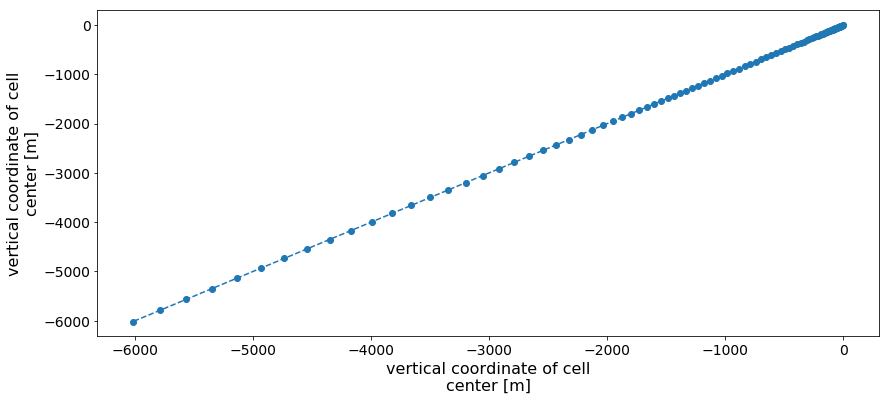

In [47]:
(ds.Z).plot(marker='o',linestyle='dashed')
#plt.yscale('log')

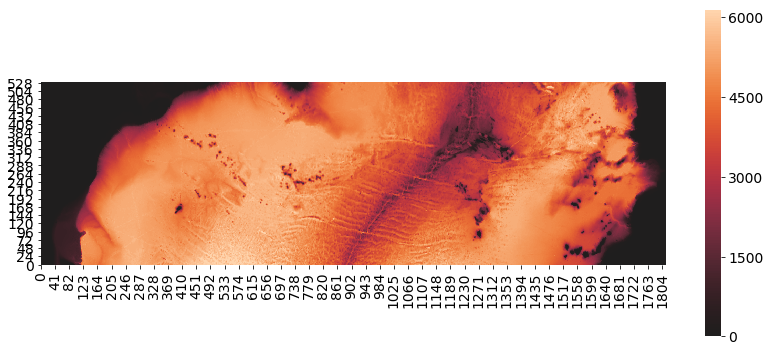

In [56]:
ax = sb.heatmap(data=ds.Depth, square=True, center=0, fmt='d')
ax.invert_yaxis()

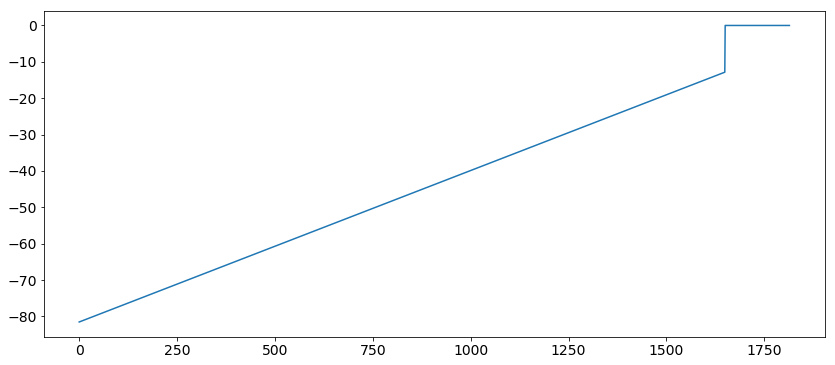

In [59]:
plt.plot(ds.XC.values)

In [8]:
dir_tides = '/central/groups/oceanphysics/anirban/tides_NAtpxo8_20080101/'

In [10]:
dir_tidal_forcing= '/central/groups/oceanphysics/anirban/NA/inputfiles/NA_2160/NA_2160/tides/'

In [13]:
f_tide = open(dir_tidal_forcing+'tide_IAU_EARTH_2008', 'rb')
tide2008 = np.fromfile(f_tide, '>f4')


In [14]:
tide2008.shape = (8784,181,360)

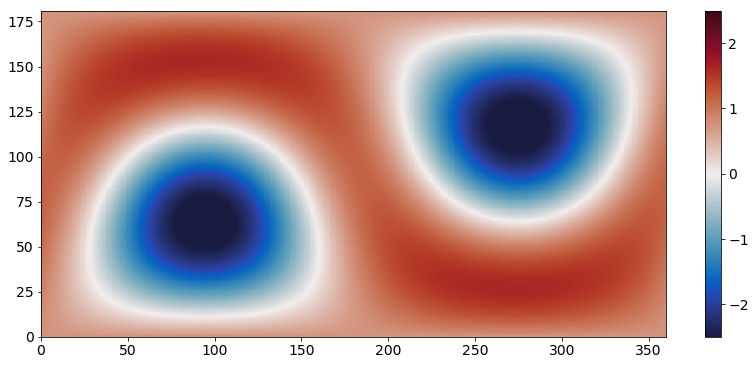

In [42]:
plt.pcolormesh(tide2008[100], cmap=cmocean.cm.balance, vmax=2.5, vmin=-2.5);plt.colorbar()

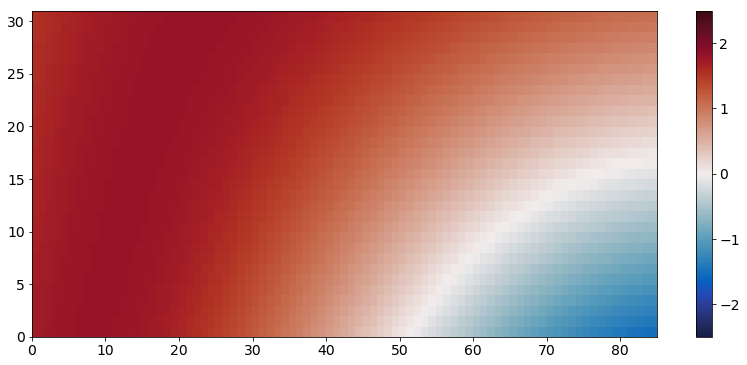

In [71]:
plt.pcolormesh(tide2008[900,113:144, 275:360], cmap=cmocean.cm.balance, vmax=2.5, vmin=-2.5);plt.colorbar()

In [15]:
tideNA_d = tide2008[::24,116:135,277:357]

In [16]:
tideNA_d.shape

(366, 19, 80)

In [17]:
len(tideNA_d)

366

In [18]:
x = np.linspace(-83,-4,80)
y = np.linspace(26,44,19)
X,Y = np.meshgrid(x,y)

In [19]:
cl

In [ ]:
for i in range(len(tideNA_d)):
    plt.figure(figsize=(12,4))
    plt.contourf(X,Y, tideNA_d[i], cmap=cmocean.cm.balance);
    plt.clim([-2.5,2.5]);plt.colorbar()
    plt.xlabel('Lon', fontsize=12)
    plt.ylabel('Lat', fontsize=12)
    plt.title('Tidal Potential, Day %s' %(i+1))
    plt.tight_layout()
    
    plt.savefig(figdir+'tidepotc_d_%06d'%i)

    display.clear_output(wait=True)
    display.display(plt.gcf())

    time.sleep(0.1)

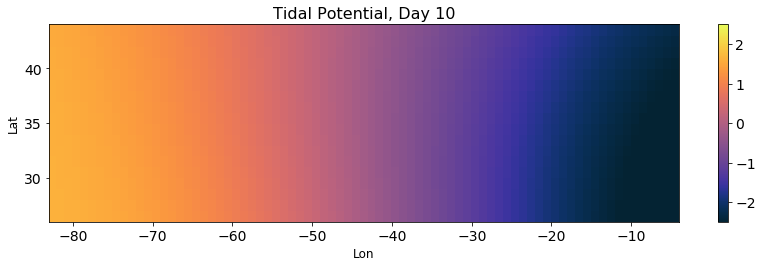

In [102]:
i=9
plt.figure(figsize=(12,4))
plt.pcolormesh(X,Y, tideNA_d[i], cmap=cmocean.cm.thermal);
plt.clim([-2.5,2.5]);plt.colorbar()
plt.xlabel('Lon', fontsize=12)
plt.ylabel('Lat', fontsize=12)
plt.title('Tidal Potential, Day %s' %(i+1))
plt.tight_layout()

In [11]:
cl = ['m2', 's2', 'n2', 'k2', 'k1','o1','p1','q1','m4','ms4','mn4','mm','mf']

In [12]:
f_amps = open(dir_tides+'am_z_mon_001.bin', 'rb')
am_z = np.fromfile(f_amps, '>f4')
am_z.shape = (532,1815,13)

In [13]:
f_ph = open(dir_tides+'ph_z_mon_001.bin', 'rb')
ph_z = np.fromfile(f_ph, '>f4')
ph_z.shape = (532,1815,13)

In [14]:
ph_z_masked = np.ma.masked_where(ph_z==0, ph_z)
am_z_masked = np.ma.masked_where(ph_z==0, am_z)

watermask = ph_z_masked.mask
landmask = np.ma.masked_where(watermask!=True, watermask)  

In [15]:
dates = ['2008/1/1','2008/2/1','2008/3/1','2008/4/1','2008/5/1','2008/6/1',
         '2008/7/1','2008/8/1','2008/9/1','2008/10/1','2008/11/1','2008/12/1',
        '2009/1/1','2009/2/1','2009/3/1','2009/4/1','2009/5/1','2009/6/1',
         '2009/7/1','2009/8/1','2009/9/1','2009/10/1','2009/11/1','2009/12/1',]

In [16]:
figdir = 'Figs_tidal_amp_ph/'

In [17]:
days = np.linspace(1,366,366)

In [31]:
days

array([  1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,
        12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,
        23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,
        34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,
        45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,
        56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,  66.,
        67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,  77.,
        78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,  88.,
        89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,  99.,
       100., 101., 102., 103., 104., 105., 106., 107., 108., 109., 110.,
       111., 112., 113., 114., 115., 116., 117., 118., 119., 120., 121.,
       122., 123., 124., 125., 126., 127., 128., 129., 130., 131., 132.,
       133., 134., 135., 136., 137., 138., 139., 140., 141., 142., 143.,
       144., 145., 146., 147., 148., 149., 150., 15

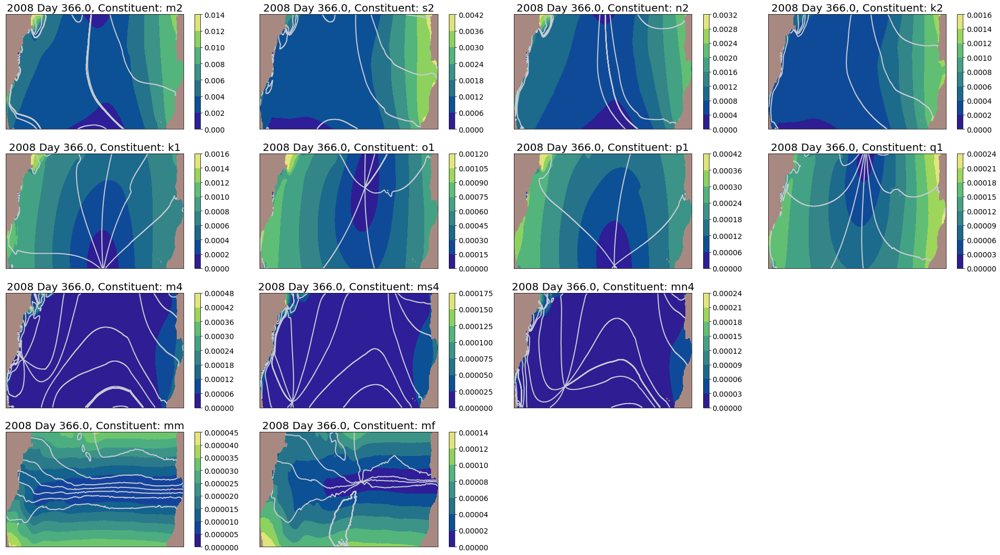

In [ ]:
for j in range(296,366):
    f_amps = open(dir_tides+'am_z_%05d.bin' %(j+1), 'rb')
    am_z = np.fromfile(f_amps, '>f4')
    am_z.shape = (532,1815,13)
    f_amps.close()
    f_ph = open(dir_tides+'ph_z_%05d.bin' %(j+1), 'rb')
    ph_z = np.fromfile(f_ph, '>f4')
    ph_z.shape = (532,1815,13)
    f_ph.close()
    ph_z_masked = np.ma.masked_where(watermask==True, ph_z)
    am_z_masked = np.ma.masked_where(watermask==True, am_z)
    plt.figure(figsize=(27,15))
    for i in range(11):
        plt.subplot(4,4,i+1)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('2008 Day %s, Constituent: %s' %(days[j],cl[i]), fontsize=20)
    for i in range(11,13):
        plt.subplot(4,4,i+2)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('2008 Day %s, Constituent: %s' %(days[j],cl[i]), fontsize=20)
        plt.tight_layout()
    plt.savefig(figdir+'tidal_amp_ph_daily_%05d'%j)
    display.clear_output(wait=True)
    display.display(plt.gcf())
    time.sleep(0.1)

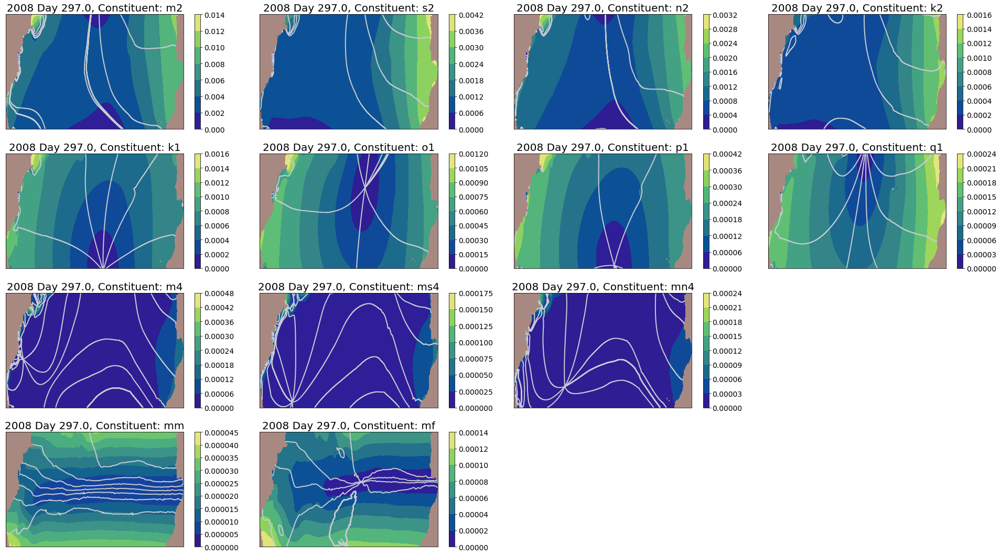

In [ ]:
for j in range(145,366):
    f_amps = open(dir_tides+'am_z_%05d.bin' %(j+1), 'rb')
    am_z = np.fromfile(f_amps, '>f4')
    am_z.shape = (532,1815,13)
    f_amps.close()
    f_ph = open(dir_tides+'ph_z_%05d.bin' %(j+1), 'rb')
    ph_z = np.fromfile(f_ph, '>f4')
    ph_z.shape = (532,1815,13)
    f_ph.close()
    ph_z_masked = np.ma.masked_where(watermask==True, ph_z)
    am_z_masked = np.ma.masked_where(watermask==True, am_z)
    plt.figure(figsize=(27,15))
    for i in range(11):
        plt.subplot(4,4,i+1)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('2008 Day %s, Constituent: %s' %(days[j],cl[i]), fontsize=20)
    for i in range(11,13):
        plt.subplot(4,4,i+2)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('2008 Day %s, Constituent: %s' %(days[j],cl[i]), fontsize=20)
        plt.tight_layout()
    plt.savefig(figdir+'tidal_amp_ph_daily_%05d'%j)
    display.clear_output(wait=True)
    display.display(plt.gcf())
    time.sleep(0.1)

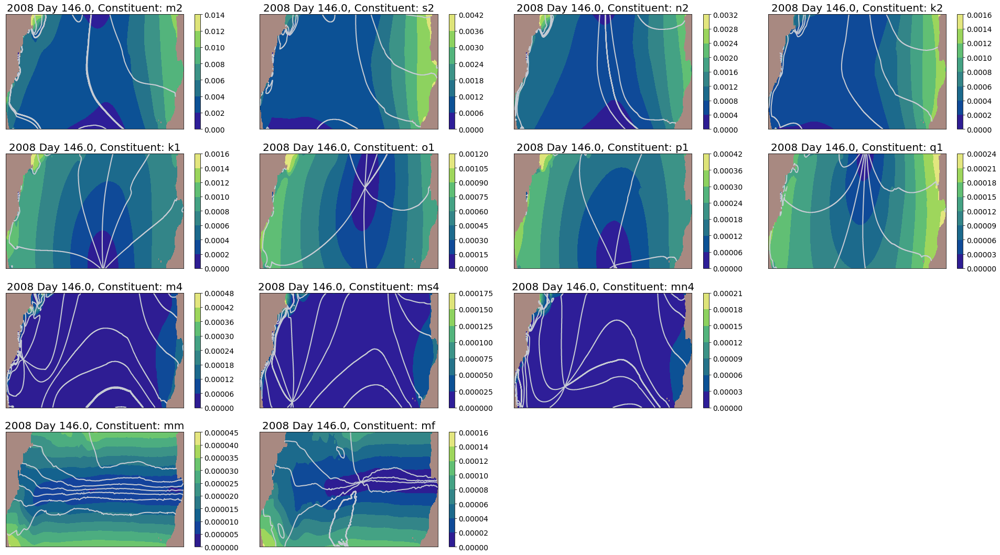

In [ ]:
for j in range(366):
    f_amps = open(dir_tides+'am_z_%05d.bin' %(j+1), 'rb')
    am_z = np.fromfile(f_amps, '>f4')
    am_z.shape = (532,1815,13)
    f_amps.close()
    f_ph = open(dir_tides+'ph_z_%05d.bin' %(j+1), 'rb')
    ph_z = np.fromfile(f_ph, '>f4')
    ph_z.shape = (532,1815,13)
    f_ph.close()
    ph_z_masked = np.ma.masked_where(watermask==True, ph_z)
    am_z_masked = np.ma.masked_where(watermask==True, am_z)
    plt.figure(figsize=(27,15))
    for i in range(11):
        plt.subplot(4,4,i+1)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('2008 Day %s, Constituent: %s' %(days[j],cl[i]), fontsize=20)
    for i in range(11,13):
        plt.subplot(4,4,i+2)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('2008 Day %s, Constituent: %s' %(days[j],cl[i]), fontsize=20)
        plt.tight_layout()
    plt.savefig(figdir+'tidal_amp_ph_daily_%05d'%j)
    display.clear_output(wait=True)
    display.display(plt.gcf())
    time.sleep(0.1)

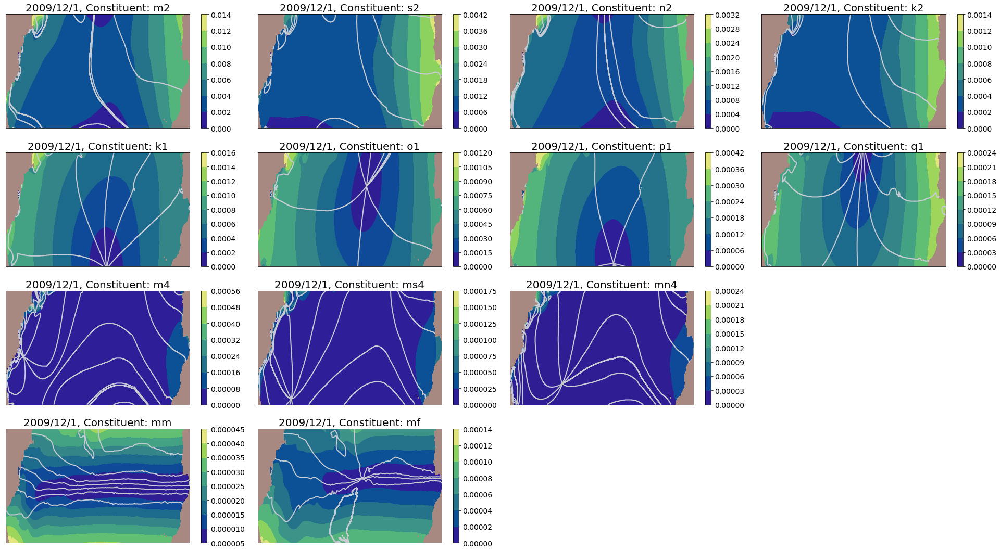

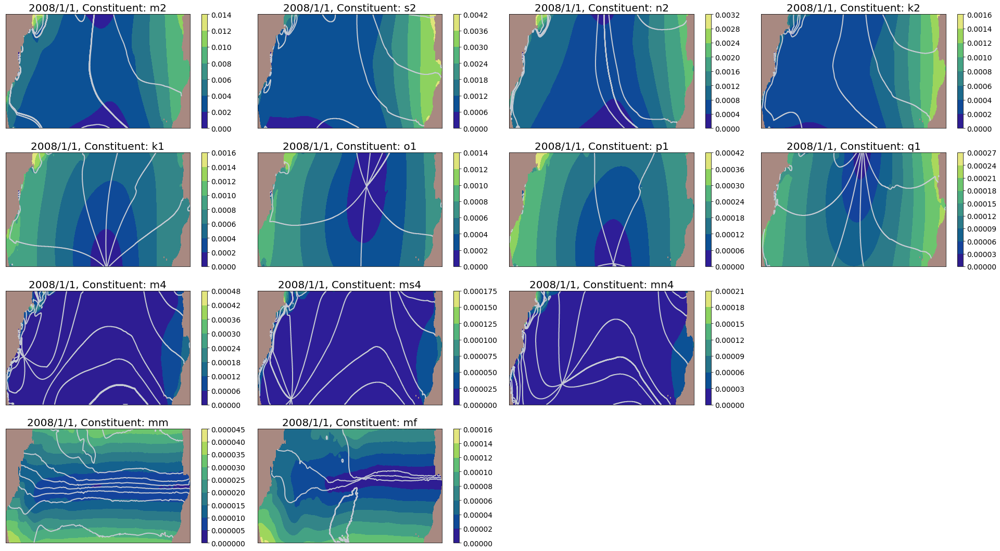

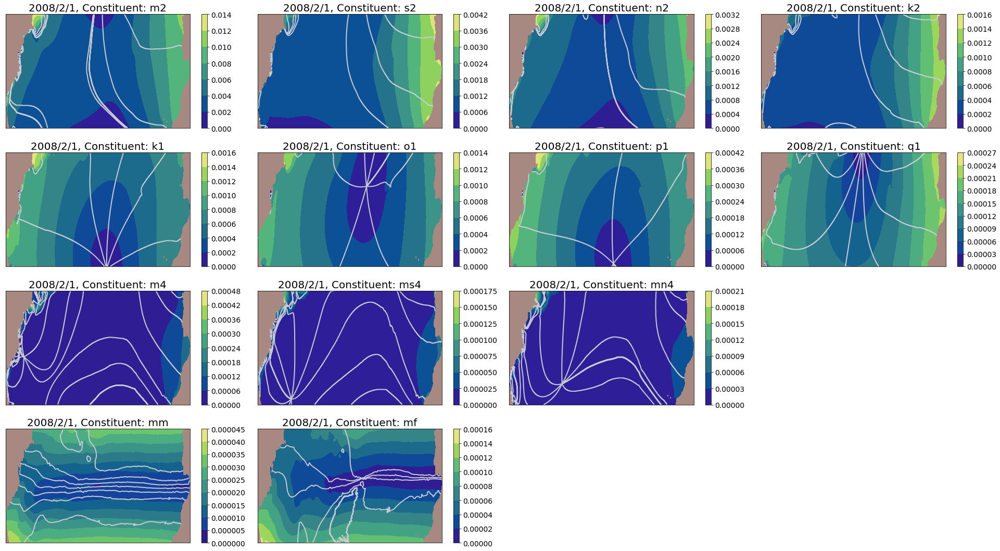

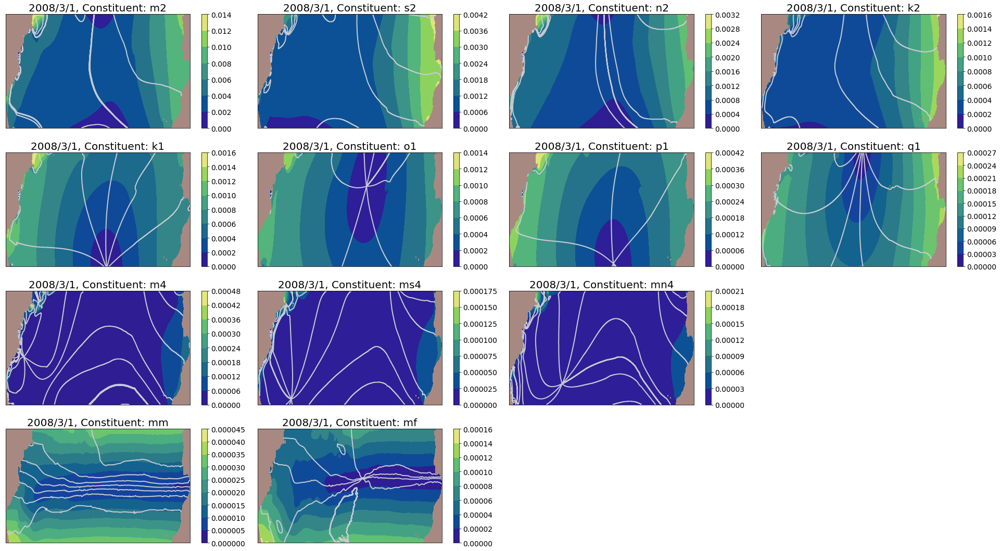

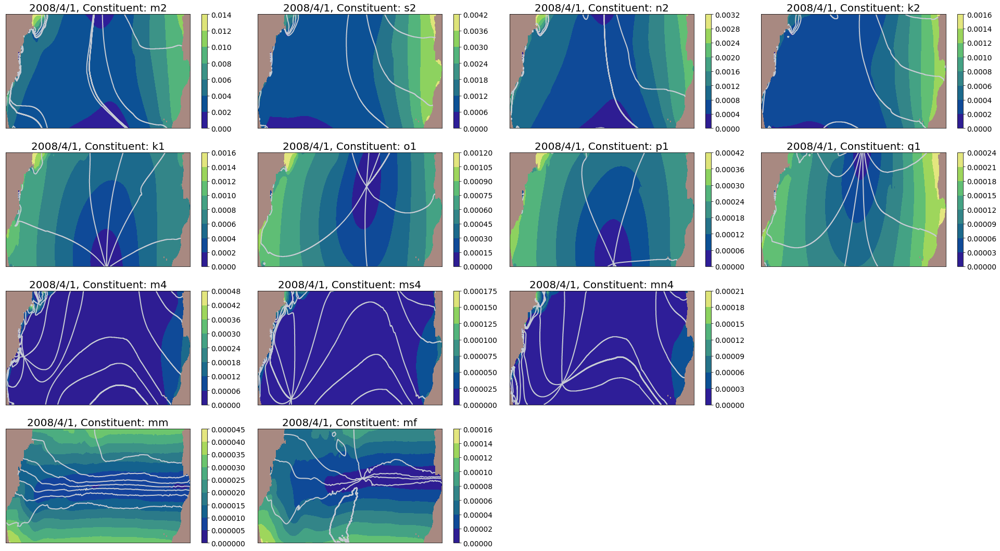

...

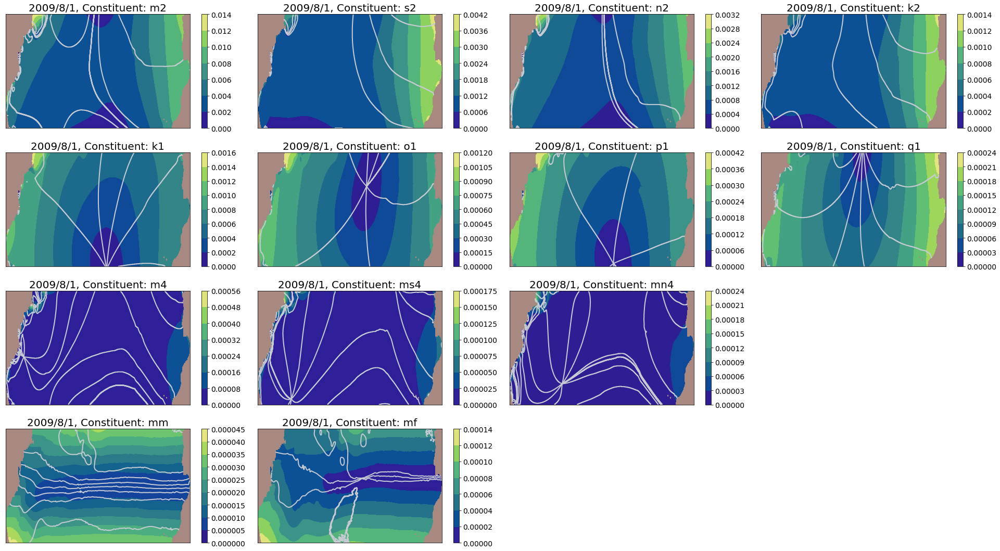

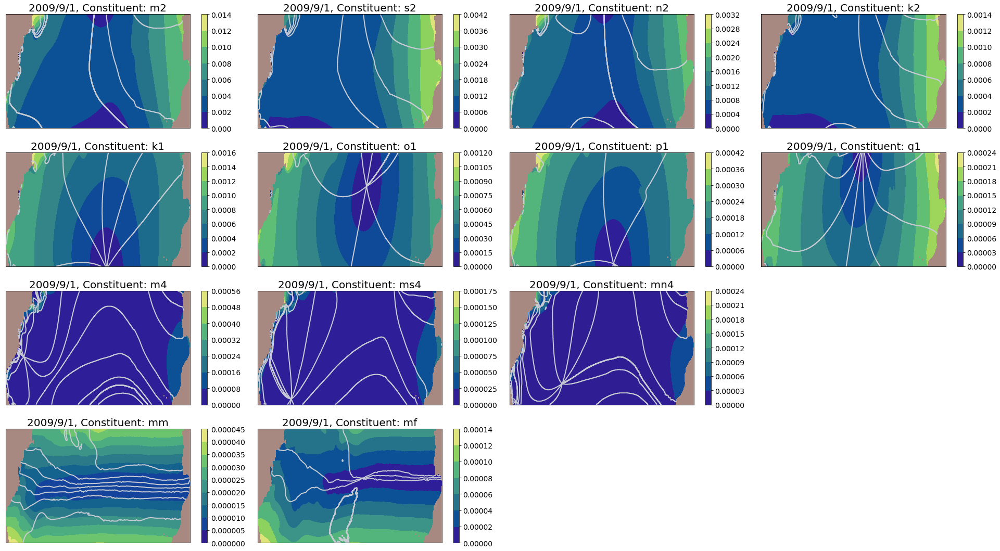

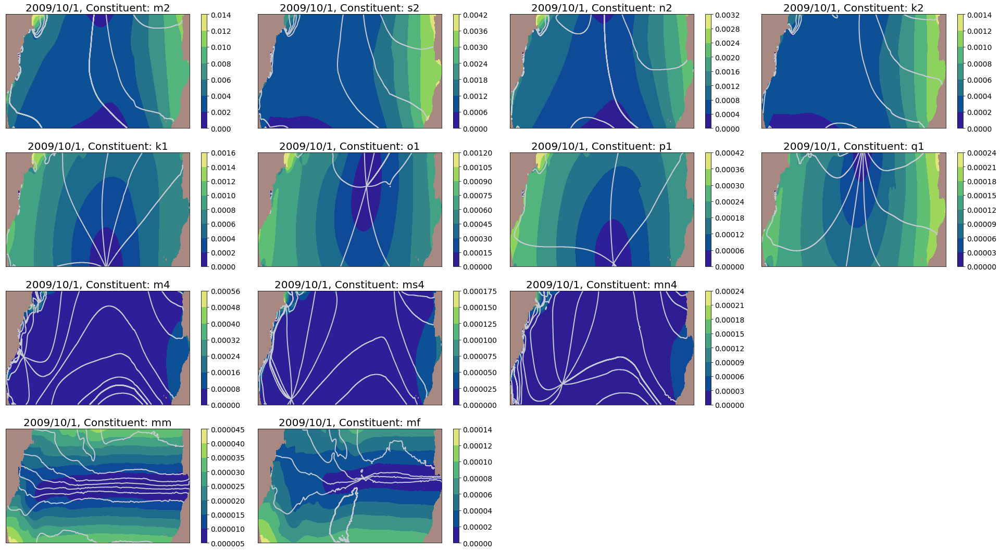

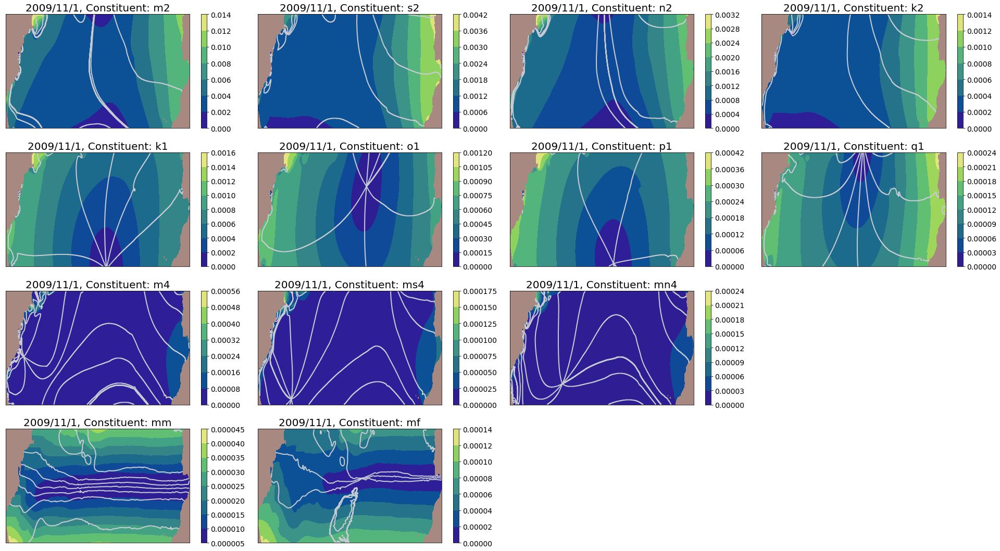

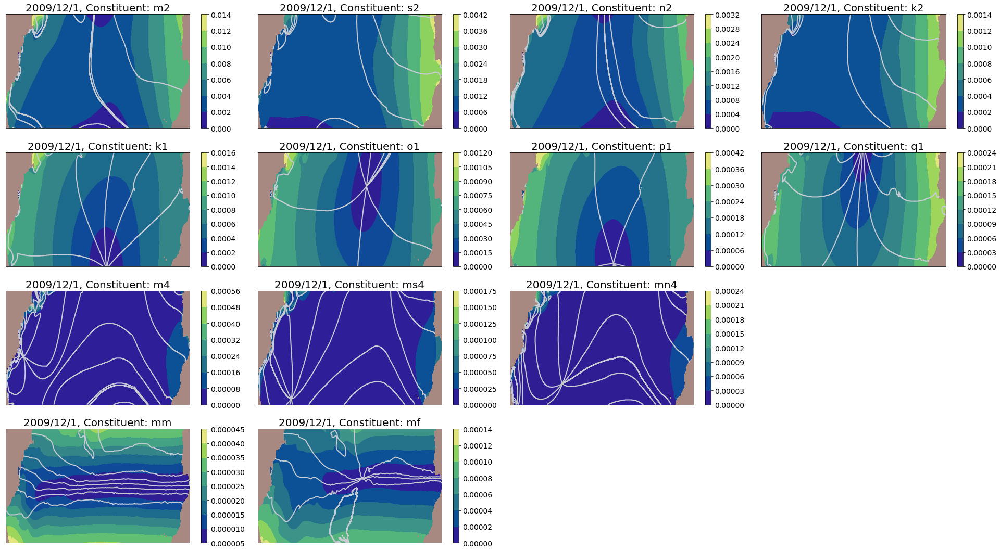

In [82]:
for j in range(24):
    f_amps = open(dir_tides+'am_z_mon_%03d.bin' %(j+1), 'rb')
    am_z = np.fromfile(f_amps, '>f4')
    am_z.shape = (532,1815,13)
    f_amps.close()
    f_ph = open(dir_tides+'ph_z_mon_%03d.bin' %(j+1), 'rb')
    ph_z = np.fromfile(f_ph, '>f4')
    ph_z.shape = (532,1815,13)
    f_ph.close()
    ph_z_masked = np.ma.masked_where(watermask==True, ph_z)
    am_z_masked = np.ma.masked_where(watermask==True, am_z)
    plt.figure(figsize=(27,15))
    for i in range(11):
        plt.subplot(4,4,i+1)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('%s, Constituent: %s' %(dates[j],cl[i]), fontsize=20)
    for i in range(11,13):
        plt.subplot(4,4,i+2)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('%s, Constituent: %s' %(dates[j],cl[i]), fontsize=20)
        plt.tight_layout()
    plt.savefig(figdir+'tidal_amp_ph_months_%03d'%j)
    display.clear_output(wait=True)
    display.display(plt.gcf())
    time.sleep(1)

In [20]:
f_amps = open(dir_tides+'tpxo7_am_z_mon_001.bin', 'rb')
am_z = np.fromfile(f_amps, '>f4')
am_z.shape = (532,1815,13)
f_ph = open(dir_tides+'tpxo7_ph_z_mon_001.bin', 'rb')
ph_z = np.fromfile(f_ph, '>f4')
ph_z.shape = (532,1815,13)

ph_z_masked = np.ma.masked_where(ph_z==0, ph_z)
am_z_masked = np.ma.masked_where(ph_z==0, am_z)

watermask = ph_z_masked.mask
landmask = np.ma.masked_where(watermask!=True, watermask)  

In [ ]:
for j in range(24):
    f_amps = open(dir_tides+'tpxo7_am_z_mon_%03d.bin' %(j+1), 'rb')
    am_z = np.fromfile(f_amps, '>f4')
    am_z.shape = (532,1815,13)
    f_amps.close()
    f_ph = open(dir_tides+'tpxo7_ph_z_mon_%03d.bin' %(j+1), 'rb')
    ph_z = np.fromfile(f_ph, '>f4')
    ph_z.shape = (532,1815,13)
    f_ph.close()
    ph_z_masked = np.ma.masked_where(watermask==True, ph_z)
    am_z_masked = np.ma.masked_where(watermask==True, am_z)
    plt.figure(figsize=(27,15))
    for i in range(11):
        plt.subplot(4,4,i+1)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('%s, Constituent: %s' %(dates[j],cl[i]), fontsize=20)
    for i in range(11,13):
        plt.subplot(4,4,i+2)
        plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
        plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
        #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
        plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
        plt.xticks([])
        plt.yticks([])
        plt.title('%s, Constituent: %s' %(dates[j],cl[i]), fontsize=20)
        plt.tight_layout()
    plt.savefig(figdir+'tpxo7_tidal_amp_ph_months_%03d'%j)
    display.clear_output(wait=True)
    display.display(plt.gcf())
    time.sleep(1)

In [27]:
f_amps = open(dir_tides+'am_z_mon_001.bin', 'rb')
am_z = np.fromfile(f_amps, '>f4')
am_z.shape = (532,1815,13)
f_ph = open(dir_tides+'ph_z_mon_001.bin', 'rb')
ph_z = np.fromfile(f_ph, '>f4')
ph_z.shape = (532,1815,13)

ph_z_masked = np.ma.masked_where(ph_z==0, ph_z)
am_z_masked = np.ma.masked_where(ph_z==0, am_z)

watermask = ph_z_masked.mask
landmask = np.ma.masked_where(watermask!=True, watermask)  

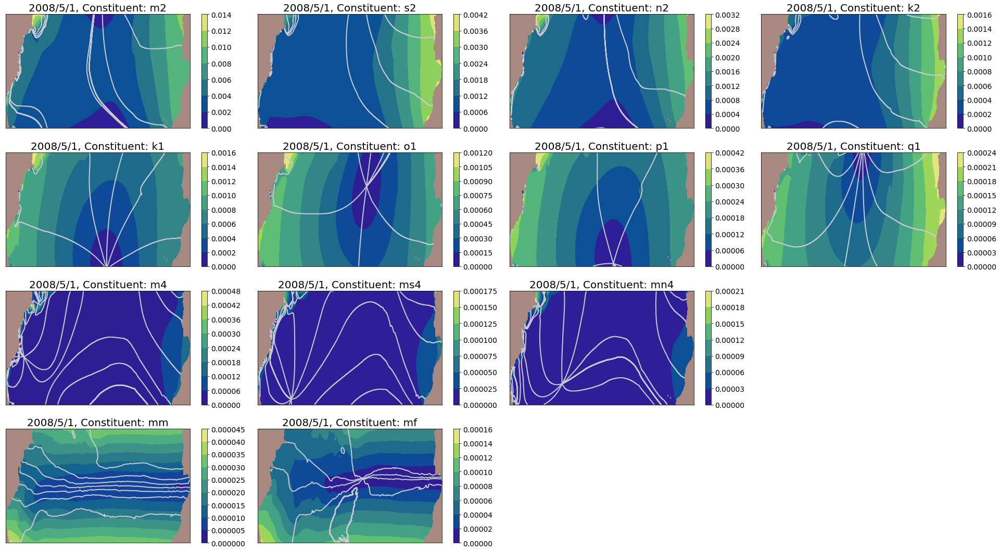

In [28]:
j=4
f_amps = open(dir_tides+'am_z_mon_%03d.bin' %(j+1), 'rb')
am_z = np.fromfile(f_amps, '>f4')
am_z.shape = (532,1815,13)
f_amps.close()
f_ph = open(dir_tides+'ph_z_mon_%03d.bin' %(j+1), 'rb')
ph_z = np.fromfile(f_ph, '>f4')
ph_z.shape = (532,1815,13)
f_ph.close()
ph_z_masked = np.ma.masked_where(watermask==True, ph_z)
am_z_masked = np.ma.masked_where(watermask==True, am_z)
plt.figure(figsize=(27,15))
for i in range(11):
    plt.subplot(4,4,i+1)
    plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
    plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
    #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
    plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
    plt.xticks([])
    plt.yticks([])
    plt.title('%s, Constituent: %s' %(dates[j],cl[i]), fontsize=20)
for i in range(11,13):
    plt.subplot(4,4,i+2)
    plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
    plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
    #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
    plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
    plt.xticks([])
    plt.yticks([])
    plt.title('%s, Constituent: %s' %(dates[j],cl[i]), fontsize=20)
    plt.tight_layout()
#plt.savefig(figdir+'tidal_amp_ph_months_%03d'%j)
#display.clear_output(wait=True)
#display.display(plt.gcf())
#time.sleep(1)

In [ ]:
#cea89f

In [143]:
for i in range(11,13):
    print(i)

11
12


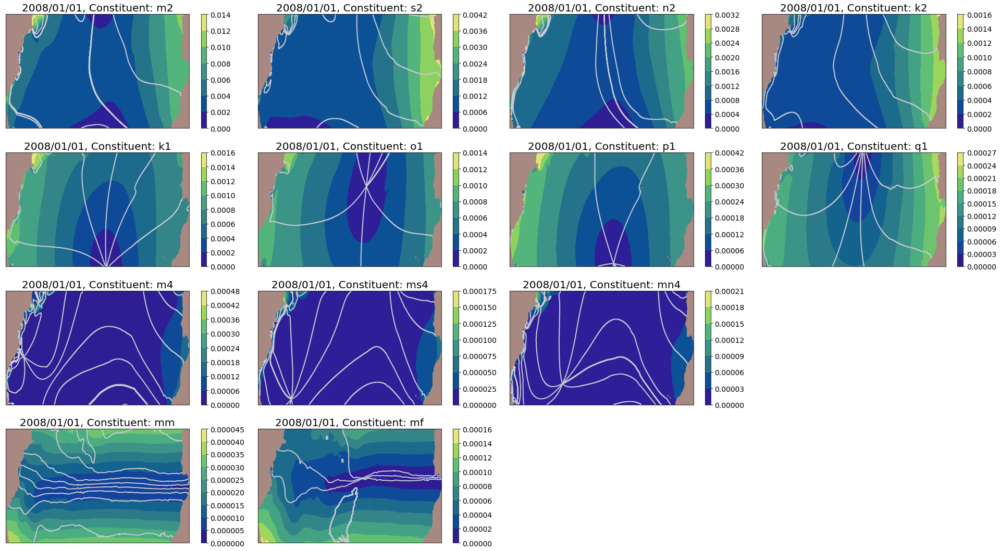

In [16]:
plt.figure(figsize=(27,15))
for i in range(11):
    plt.subplot(4,4,i+1)
    plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
    plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
    #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
    plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
    plt.xticks([])
    plt.yticks([])
    plt.title('2008/01/01, Constituent: %s' %cl[i], fontsize=20)
for i in range(11,13):
    plt.subplot(4,4,i+2)
    plt.contourf(am_z_masked[:,:,i], cmap=cmocean.cm.haline);plt.colorbar()
    plt.contour(ph_z_masked[:,:,i],  colors='#c6cbd3',linewidths=2, linestyles='solid')
    #plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#9A7D77']));
    plt.pcolormesh(landmask[:,:,i], cmap=mpl.colors.ListedColormap(['#a88981']));
    plt.xticks([])
    plt.yticks([])
    plt.title('2008/01/01, Constituent: %s' %cl[i], fontsize=20)
    plt.tight_layout()


In [17]:
print(date.toordinal(date(2009,1,1))+366)

733774


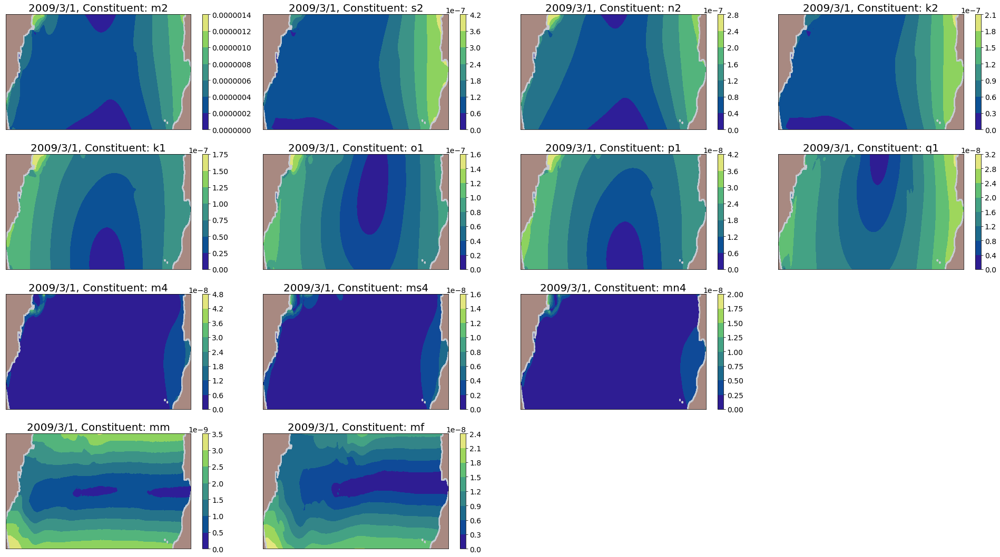

KeyboardInterrupt: 

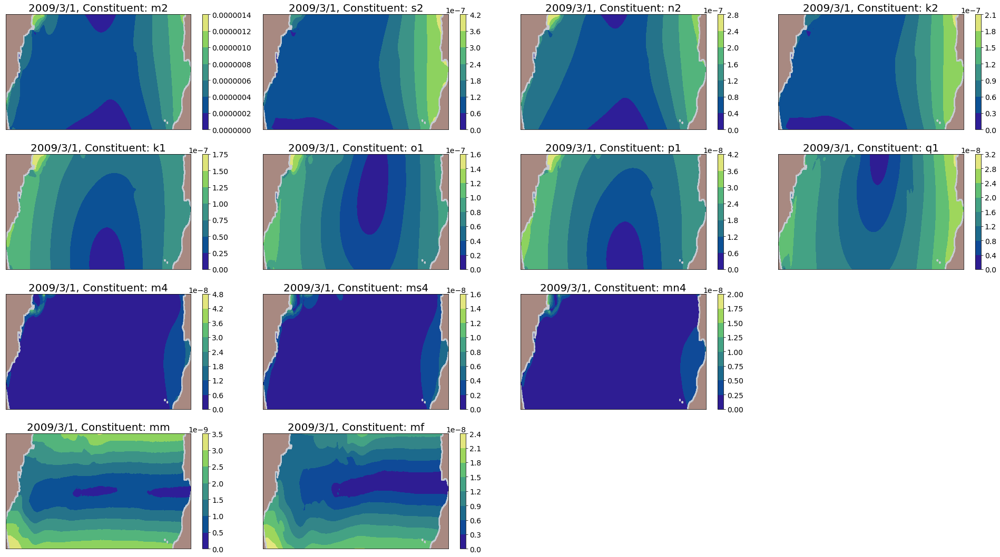

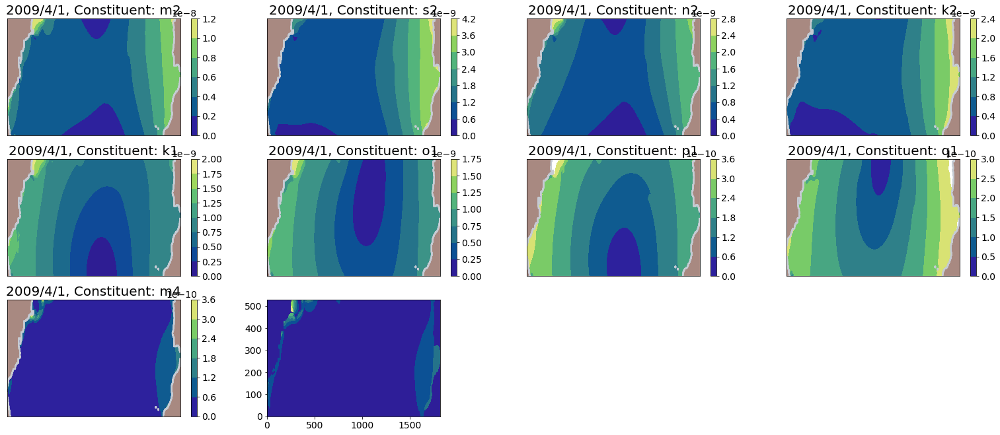

NameError: name 'landmask' is not defined

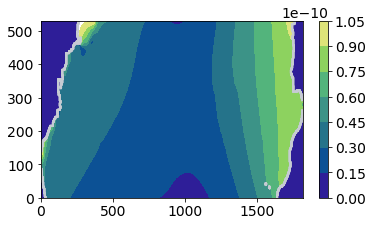

In [36]:
f_h = open(dir_tides+'h_v_1815x532.bin', 'rb')
h_v = np.fromfile(f_h, '>f4')
h_v.shape

(965580,)

In [37]:
h_v.shape = (532,1815)

In [ ]:
plt.pcolormesh(h_v);plt.colorbar()

In [62]:
5.049e8/180

2805000.0

In [58]:
1/(5.049e8/180)

3.5650623885918005e-07

In [14]:
ph_z0 = ph_z[:,:,0]


In [16]:
ph_z0_masked = np.ma.masked_where(ph_z0==0, ph_z0)


In [64]:
f_amps = open(dir_tides+'OBvam_13x1815x532.bin', 'rb')
am_v = np.fromfile(f_amps, '>f4')
am_v.shape = (532,1815,13)

In [68]:
am_v[:,:,0].shape

(532, 1815)

In [83]:
f_amps = open(dir_tides+'OBuam_13x1815x532.bin', 'rb')
am_u = np.fromfile(f_amps, '>f4')
am_u.shape = (532,1815,13)

In [85]:
f_ph = open(dir_tides+'OBuph_13x1815x532.bin', 'rb')
ph_u = np.fromfile(f_ph, '>f4')
ph_u.shape = (532,1815,13)

In [98]:
f_ph = open(dir_tides+'OBvph_13x1815x532.bin', 'rb')
ph_v = np.fromfile(f_ph, '>f4')
ph_v.shape = (532,1815,13)

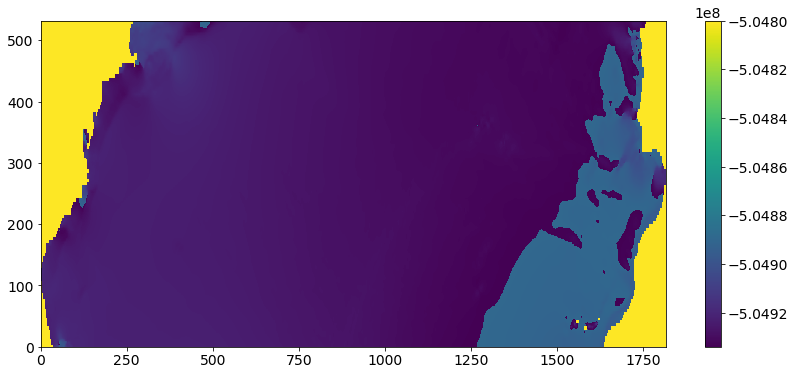

In [97]:
plt.pcolormesh(ph_u[:,:,0], vmax=-5.048e8);
plt.colorbar()

In [111]:
am_u0 = am_u[:,:,0]
am_v0 = am_v[:,:,0]
am_u1 = am_u[:,:,1]
am_v1 = am_v[:,:,1]
am_u2 = am_u[:,:,2]
am_v2 = am_v[:,:,2]

In [103]:
ph_u0 = ph_u[:,:,0]
ph_v0 = ph_v[:,:,0]
ph_u1 = ph_u[:,:,1]
ph_v1 = ph_v[:,:,1]
ph_u2 = ph_u[:,:,2]
ph_v2 = ph_v[:,:,2]

In [112]:
ph_u0_masked = np.ma.masked_where(ph_u0==0, ph_u0)
ph_v0_masked = np.ma.masked_where(ph_v0==0, ph_v0)

ph_u1_masked = np.ma.masked_where(ph_u1==0, ph_u1)
ph_v1_masked = np.ma.masked_where(ph_v1==0, ph_v1)

ph_u2_masked = np.ma.masked_where(ph_u2==0, ph_u2)
ph_v2_masked = np.ma.masked_where(ph_v2==0, ph_v2)

am_u0_masked = np.ma.masked_where(ph_u0==0, am_u0)
am_v0_masked = np.ma.masked_where(ph_v0==0, am_v0)

am_u1_masked = np.ma.masked_where(ph_u1==0, am_u1)
am_v1_masked = np.ma.masked_where(ph_v1==0, am_v1)

am_u2_masked = np.ma.masked_where(ph_u2==0, am_u2)
am_v2_masked = np.ma.masked_where(ph_v2==0, am_v2)


In [115]:
f_h = open(dir_tides+'h_v_1815x532.bin', 'rb')
h_v = np.fromfile(f_h, '>f4')
h_v.shape = (532,1815)

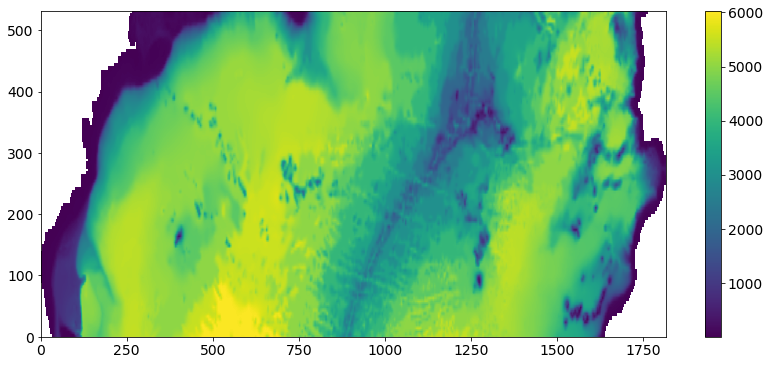

In [118]:
plt.pcolormesh(h_v);plt.colorbar()